## Подготовка данных

In [3]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report
import pandas as pd

In [4]:
df = pd.read_csv("https://storage.yandexcloud.net/auth-def-2024/datasets/meta_table_with_texts.csv")

In [5]:
df = df[['author', 'text']]
df.head(5)

,author,text
0,Пушкин Александр Сергеевич,"\n \nЛитературный альбомъ.\n""Сраженный рыцар..."
1,Карамзин Николай Михайлович,\nО достоинстве древних и новых\n(Перевод с не...
2,Гоголь Николай Васильевич,\n Гоголь Н. В. Полное собрание сочинений и ...
3,Мамин-Сибиряк Дмитрий Наркисович,\n \nД. МАМИНЪ-СИБИРЯКЪПОЛНОЕ СОБРАНІЕ СОЧИН...
4,Мамин-Сибиряк Дмитрий Наркисович,\nДмитрий Мамин-Сибиряк\nНимфа\nI.\n Щегольс...


### Расчет эвристик

*Примечание: в ходе расчетов могут дублироваться функции обработки текста, разработанные на этапе EDA.<br>*
Прежде, чем рассчитывать эвристики, почистим текст от нежелательных пробельных символов, а также некорректных unicode-символов:

In [6]:
import re

def clean_df(x):
  # Удаление unicode-символов
  x = re.sub(r'&#\d+;|&#x[0-9a-fA-F]+;', '', x)
  x = x.replace('\n', ' ')
  v2 = re.sub(r'[^А-Яа-я0-9\(\).,!?: \-]', '', x.lower())
  result = re.sub(r'\s+', ' ', v2).strip()
  return result

In [7]:
df['clean_text'] = df['text'].apply(clean_df)

In [8]:
df.head(5)

,author,text,clean_text
0,Пушкин Александр Сергеевич,"\n \nЛитературный альбомъ.\n""Сраженный рыцар...",литературный альбомъ. сраженный рыцарь. пушкин...
1,Карамзин Николай Михайлович,\nО достоинстве древних и новых\n(Перевод с не...,о достоинстве древних и новых (перевод с немец...
2,Гоголь Николай Васильевич,\n Гоголь Н. В. Полное собрание сочинений и ...,гоголь н. в. полное собрание сочинений и писем...
3,Мамин-Сибиряк Дмитрий Наркисович,\n \nД. МАМИНЪ-СИБИРЯКЪПОЛНОЕ СОБРАНІЕ СОЧИН...,д. маминъ-сибирякъполное собране сочиненйтомъ ...
4,Мамин-Сибиряк Дмитрий Наркисович,\nДмитрий Мамин-Сибиряк\nНимфа\nI.\n Щегольс...,дмитрий мамин-сибиряк нимфа . щегольской волжс...


В некоторых текстах все еще встречаются сомнительные слова, которые содержат в себе цифры (номера страниц). Поэтому дополнительно проведем очистку таких слов, чтобы цифры исчезли.

In [9]:
# Функция очистки слов, содержащих цифры
def remove_digits_from_words(text):
    return ' '.join(
        re.sub(r'\d+', '', word) if re.search(r'[a-zA-Zа-яА-Я]', word) and re.search(r'\d', word) else word
        for word in text.split()
    )

In [10]:
df['clean_text'] = df['clean_text'].apply(remove_digits_from_words)

#### Lexicon-based эвристики

В исходных экспериментах чекпойнта $3$ вычислялись такие $\text{Lexicon-based}$ эвристики, как тональность и субъективность (также рассматривалась токсичность, но ее вклад был незначим). Однако по итогам замечаний куратора было решено не учитывать данные признаки. Дело в том, что проект направлен на анализ достаточно больших текстов, определение скоров для которых будет массивным по затрачиваемым ресурсам. Более того, стандартные инструменты расчета сентимента не позволяют анализировать более $512$ токенов. В нашем датасете практически каждый текст превышает данный лимит, а значит часть важной информации будет просто отсечена.<br>
Стоит отметить, что сентимент и субъективность важно учитывать при анализе текстов, высказывающих мнение (например, комментарии). Наша задача не связана с этим.

#### Rule-based эвристики

Посчитаем **Rule-based** эвристики, представленные числовыми характеристиками текста:
- Кол-во предложений;
- Кол-во слов;
- Средняя длина предложения;
- Средняя длина слова.

In [26]:
import pandas as pd
import nltk
from nltk.tokenize import word_tokenize, sent_tokenize

nltk.download('punkt_tab')

def calculate_russian_complexity(text):
    # Токенизация
    sentences = sent_tokenize(text, language="russian")
    words = word_tokenize(text, language="russian")
    words = [word.lower() for word in words if word.isalpha()]

    # Метрики
    num_sentences = len(sentences)
    num_words = len(words)
    avg_sentence_length = num_words / num_sentences if num_sentences > 0 else 0
    avg_word_length = sum(len(word) for word in words) / num_words if num_words > 0 else 0

    return {
        "num_sentences": num_sentences,
        "num_words": num_words,
        "avg_sentence_length": avg_sentence_length,
        "avg_word_length": avg_word_length
    }

[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


In [20]:
df['complexity'] = df['clean_text'].apply(calculate_russian_complexity)

In [22]:
# Разворачиваем метрики в столбцы
complexity_df = df["complexity"].apply(pd.Series)
df = pd.concat([df, complexity_df], axis=1)

In [30]:
df['num_sentences'] = df['num_sentences'].apply(int)
df['num_words'] = df['num_words'].apply(int)

Также рассчитаем сложность текста (индекс Флеша), опираясь на средние значения по словам и предложениям, скорректировав значения коэффициентов для русскоязычных текстов:

In [148]:
def calculate_flesch_index(avg_sentence_length, avg_word_length, alpha=0.8, beta=20.0):
    return 206.835 - alpha * avg_sentence_length - beta * avg_word_length

In [149]:
df["flesch_index"] = df.apply(
    lambda row: calculate_flesch_index(row["avg_sentence_length"], row["avg_word_length"]),
    axis=1
)

In [151]:
df.head()

,author,text,clean_text,complexity,num_sentences,num_words,avg_sentence_length,avg_word_length,flesch_index
0,Пушкин Александр Сергеевич,"\n \nЛитературный альбомъ.\n""Сраженный рыцар...",литературный альбомъ. сраженный рыцарь. пушкин...,"{'num_sentences': 20, 'num_words': 347, 'avg_s...",20,347,17.350000,5.002882,92.897363
1,Карамзин Николай Михайлович,\nО достоинстве древних и новых\n(Перевод с не...,о достоинстве древних и новых (перевод с немец...,"{'num_sentences': 56, 'num_words': 988, 'avg_s...",56,988,17.642857,5.452429,83.672131
2,Гоголь Николай Васильевич,\n Гоголь Н. В. Полное собрание сочинений и ...,гоголь н. в. полное собрание сочинений и писем...,"{'num_sentences': 13286, 'num_words': 177463, ...",13286,177463,13.357143,5.226318,91.622934
3,Мамин-Сибиряк Дмитрий Наркисович,\n \nД. МАМИНЪ-СИБИРЯКЪПОЛНОЕ СОБРАНІЕ СОЧИН...,д. маминъ-сибирякъполное собране сочиненйтомъ ...,"{'num_sentences': 707, 'num_words': 8774, 'avg...",707,8774,12.410184,5.284477,91.217316
4,Мамин-Сибиряк Дмитрий Наркисович,\nДмитрий Мамин-Сибиряк\nНимфа\nI.\n Щегольс...,дмитрий мамин-сибиряк нимфа . щегольской волжс...,"{'num_sentences': 345, 'num_words': 4221, 'avg...",345,4221,12.234783,5.027008,96.507018


#### Корреляционная матрица

После расчета эвристик следует убедиться, что между ними не присутствует сильной зависимости во избежание проблемы мультиколлинеарности. Построим тепловую карту для наглядности:

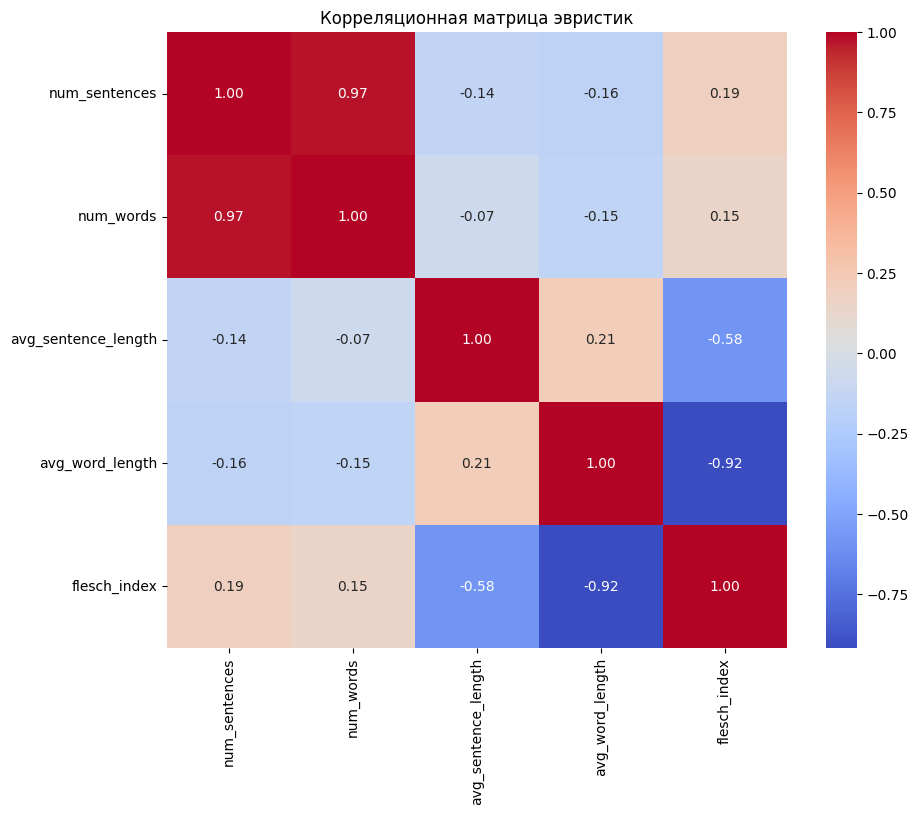

In [152]:
import matplotlib.pyplot as plt
import seaborn as sns


heuristics = ['num_sentences', 'num_words', 'avg_sentence_length', 'avg_word_length', 'flesch_index']
df_heuristics = df[heuristics].copy()

# Построение тепловой карты
plt.figure(figsize=(10, 8))
sns.heatmap(df_heuristics.corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Корреляционная матрица эвристик')
plt.show()

Мы видим, что между `num_sentences` и `num_words` наблюдается сильная прямая зависимость (коэффициент корреляции равен $0.97$), оба признака характеризуют размер текста. Оставим `num_words` как более интерпретируемый признак.<br>
Также значение индекса Флеша сильно обратно зависит от средних значений, так как буквально линейно выражается через них. В итоговом наборе эвристик исключим показатель сложности текста, оставив средние показатели.<br>
Прочие значения корреляции примем за допустимые. Таким образом, остается три числовые характеристики.

In [153]:
heuristics = ['num_words', 'avg_sentence_length', 'avg_word_length']

In [154]:
# Дополнительно сохраним файл с эвристиками.
df[heuristics].to_csv('heuristics.csv', index=False)

### Подготовка выборок

Перед векторизацией необходимо лемматизировать очищенный текст, чтобы избежать кодирования форм одних и тех же слов. Дополнительно будем удалять ФИО авторов, наличие которых в тексте приводит к `target leakage`, а также любые небуквенные леммы и леммы, короче 2 символов.

In [ ]:
import nltk
from nltk.tokenize import word_tokenize

nltk.download('punkt_tab')

In [ ]:
!pip install pymorphy2

In [ ]:
import pymorphy2

morph = pymorphy2.MorphAnalyzer()

In [ ]:
import itertools

# Список ФИО авторов, представленных в датасете
author_list = list(itertools.chain(*[author.split() for author in df.author.str.lower().unique()]))

In [ ]:
CNT = 0

# Функция леммитизации текста
def lemm_text(text):
    global CNT
    # Разбиение текста на токены
    tokens = word_tokenize(text)
    # Леммы слов
    lemmas = [morph.parse(token)[0].normal_form for token in tokens if token.isalnum()]
    # Очистка лемм
    final_lemmas = [word for word in lemmas if word not in author_list and len(word) > 2
             and not re.fullmatch(r'\d+|[^A-Za-zА-Яа-яЁё]+', word)]
    CNT += 1
    print(CNT)
    return ' '.join(final_lemmas)

In [ ]:
df['lemm_text'] = df['clean_text'].apply(lemm_text)

In [158]:
df.head()

,author,text,clean_text,complexity,num_sentences,num_words,avg_sentence_length,avg_word_length,flesch_index,lemm_text
0,Пушкин Александр Сергеевич,"\n \nЛитературный альбомъ.\n""Сраженный рыцар...",литературный альбомъ. сраженный рыцарь. пушкин...,"{'num_sentences': 20, 'num_words': 347, 'avg_s...",20,347,17.350000,5.002882,92.897363,литературный альбомъ сразить рыцарь послднимъ ...
1,Карамзин Николай Михайлович,\nО достоинстве древних и новых\n(Перевод с не...,о достоинстве древних и новых (перевод с немец...,"{'num_sentences': 56, 'num_words': 988, 'avg_s...",56,988,17.642857,5.452429,83.672131,достоинство древний новый перевод немецкий нек...
2,Гоголь Николай Васильевич,\n Гоголь Н. В. Полное собрание сочинений и ...,гоголь н. в. полное собрание сочинений и писем...,"{'num_sentences': 13286, 'num_words': 177463, ...",13286,177463,13.357143,5.226318,91.622934,полный собрание сочинение письмо так переписка...
3,Мамин-Сибиряк Дмитрий Наркисович,\n \nД. МАМИНЪ-СИБИРЯКЪПОЛНОЕ СОБРАНІЕ СОЧИН...,д. маминъ-сибирякъполное собране сочиненйтомъ ...,"{'num_sentences': 707, 'num_words': 8774, 'avg...",707,8774,12.410184,5.284477,91.217316,собрана сочиненйтомъ восьмой издан марксъ петр...
4,Мамин-Сибиряк Дмитрий Наркисович,\nДмитрий Мамин-Сибиряк\nНимфа\nI.\n Щегольс...,дмитрий мамин-сибиряк нимфа . щегольской волжс...,"{'num_sentences': 345, 'num_words': 4221, 'avg...",345,4221,12.234783,5.027008,96.507018,нимфа щегольский волжский пароход вулкан дать ...


In [ ]:
# Дополнительно сохранение лемматизированных текстов
df[['author', 'lemm_text']].to_csv('lemm_texts.csv', index=False)

Удаляем из датафрейма невалидный текст Гоголя, который пришел из ресурса-источника на английском языке.

In [76]:
df_heuristics = df_heuristics.drop(index=1918)
df_heuristics = df_heuristics.reset_index(drop=True)

In [79]:
df = df.drop(index=1918)
df = df.reset_index(drop=True)

In [159]:
# Разбиваем выборки
X_text = df['lemm_text'].copy()
X_heuristics = df[heuristics].copy()
y = df['author'].copy()

Для векторизации выберем $BoW$. Разделим выборку лемматизированного текста на $train$ и $test$. Попробуем использовать разные размеры словарей для векторайзера, а качество замерим с помощью простой модельки `MultinomialNB` и выберем наиболее оптимальный размер:

In [88]:
X_train, X_test, y_train, y_test = train_test_split(X_text, y, test_size=0.2, random_state=42)

In [89]:
# Размеры словаря для проверки
sizes = [100, 500, 1000, 5000]

In [90]:
from sklearn.naive_bayes import MultinomialNB

for size in sizes:
    # Инициализация CountVectorizer
    vectorizer = CountVectorizer(ngram_range=(1, 2), max_features=size)

    # Преобразование текстов в векторное представление
    X_train_vect = vectorizer.fit_transform(X_train)
    X_test_vect = vectorizer.transform(X_test)

    # Обучение модели
    model = MultinomialNB()
    model.fit(X_train_vect, y_train)

    # Предсказание и оценка качества
    y_pred = model.predict(X_test_vect)
    acc_score = accuracy_score(y_test, y_pred)
    print(f"Размер словаря: {size}, точность: {acc_score:.4f}")

Размер словаря: 100, точность: 0.4893
Размер словаря: 500, точность: 0.5789
Размер словаря: 1000, точность: 0.6394
Размер словаря: 5000, точность: 0.7583


Как мы видим, с увеличением размера словаря, увеличивается значение метрики качества. Поэтому далее будем рассматривать параметр `max_features=5000`.

In [91]:
print(X_train_vect.shape)
print(X_test_vect.shape)

(2051, 5000)
(513, 5000)


По сути есть 3 подхода к обучению моделей:
- только на эвристиках,
- только на текстовых признаках,
- комбинированный подход.

Так что на этапе обучения модели будем рассматривать все возможные подходы.

### Обучение трех разных моделей и их метрики (baseline)

#### Только эвристики

In [163]:
from sklearn.preprocessing import StandardScaler

X_train, X_test, y_train, y_test = train_test_split(X_heuristics, y, test_size=0.2, random_state=42)

# Числовые признаки лучше стандартизировать
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [164]:
import numpy as np

y_pred_random = np.random.choice(np.unique(y_test), size=len(y_test))
# Оценка точности случайного предсказания
accuracy_random = accuracy_score(y_test, y_pred_random)
print(f"Accuracy (Random Baseline): {accuracy_random:.2f}")

Accuracy (Random Baseline): 0.09


Точность случайного предсказания оказывается достаточно низкой (при повторных прогонах значение не превышало $0.09$). Поэтому по метрикам качества будет разумно сравнивать уже между обученными моделями на разных подходах к отбору признаков.

In [165]:
# Инициализация и обучение моделей
model_SVC = SVC(kernel='linear', random_state=42)
model_logreg = LogisticRegression(random_state=42, max_iter=1000)
model_dt = DecisionTreeClassifier(max_depth=5, random_state=42)

model_SVC.fit(X_train_scaled, y_train)
model_logreg.fit(X_train_scaled, y_train)
model_dt.fit(X_train_scaled, y_train)

DecisionTreeClassifier(max_depth=5, random_state=42)

In [166]:
# Предсказания
y_pred_SVC = model_SVC.predict(X_test_scaled)
y_pred_logreg = model_logreg.predict(X_test_scaled)
y_pred_dt = model_dt.predict(X_test_scaled)

##### Метрики качества

###### SVC

In [167]:
# Оценка качества модели
# Accuracy
accuracy = accuracy_score(y_test, y_pred_SVC)
print("Accuracy:", accuracy)

# Precision, Recall, F1 (взвешенные для многоклассовой задачи)
precision = precision_score(y_test, y_pred_SVC, average='weighted')
recall = recall_score(y_test, y_pred_SVC, average='weighted')
f1 = f1_score(y_test, y_pred_SVC, average='weighted')

print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

# Матрица ошибок
conf_matrix = confusion_matrix(y_test, y_pred_SVC)
print("Confusion Matrix:\n", conf_matrix)

Accuracy: 0.2202729044834308
Precision: 0.16218878255367852
Recall: 0.2202729044834308
F1 Score: 0.15367488079279767
Confusion Matrix:
 [[ 0  3  0  0  0  6 12  0  1  0  0  0  0]
 [ 0 21  0  0  0  6 20  0  0  0  0  2  0]
 [ 0  5  0  1  0  5 16  0  5  0  6  2  0]
 [ 0  4  0  3  0 12 18  0  2  0  2  3  0]
 [ 0  8  0  0  0  0  4  0  0  0  0  0  0]
 [ 0  4  0  0  0  9 35  0  0  0  6  2  0]
 [ 0  1  0  0  0  7 56  0  1  0  0  1  0]
 [ 0  3  0  0  0  4  1  0  0  0  1  0  0]
 [ 0  1  0  0  0  4 39  0  4  0  2  3  0]
 [ 0  3  0  1  0  1 22  0  1  0  2  4  0]
 [ 0  1  0  3  0  8  8  0  0  0 16  1  0]
 [ 0  6  0  4  0 10 32  0  3  0  6  4  0]
 [ 0  4  0  2  1  2 14  0  0  0  2  1  0]]


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [168]:
# Полный отчет
print("\nClassification Report:")
print(classification_report(y_test, y_pred_SVC))


Classification Report:
                                   precision    recall  f1-score   support

     Блок Александр Александрович       0.00      0.00      0.00        22
            Бунин Иван Алексеевич       0.33      0.43      0.37        49
        Гоголь Николай Васильевич       0.00      0.00      0.00        40
     Достоевский Федор Михайлович       0.21      0.07      0.10        44
      Есенин Сергей Александрович       0.00      0.00      0.00        12
      Карамзин Николай Михайлович       0.12      0.16      0.14        56
        Куприн Александр Иванович       0.20      0.85      0.33        66
         Лермонтов Михаил Юрьевич       0.00      0.00      0.00         9
 Мамин-Сибиряк Дмитрий Наркисович       0.24      0.08      0.11        53
       Пушкин Александр Сергеевич       0.00      0.00      0.00        34
Салтыков-Щедрин Михаил Евграфович       0.37      0.43      0.40        37
          Тургенев Иван Сергеевич       0.17      0.06      0.09        65


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


###### LogisticRegression

In [169]:
# Оценка качества модели
# Accuracy
accuracy = accuracy_score(y_test, y_pred_logreg)
print("Accuracy:", accuracy)

# Precision, Recall, F1 (взвешенные для многоклассовой задачи)
precision = precision_score(y_test, y_pred_logreg, average='weighted')
recall = recall_score(y_test, y_pred_logreg, average='weighted')
f1 = f1_score(y_test, y_pred_logreg, average='weighted')

print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

# Матрица ошибок
conf_matrix = confusion_matrix(y_test, y_pred_logreg)
print("Confusion Matrix:\n", conf_matrix)

Accuracy: 0.2124756335282651
Precision: 0.1462051849372751
Recall: 0.2124756335282651
F1 Score: 0.1481534877542628
Confusion Matrix:
 [[ 0  3  0  0  0  6 10  0  1  0  0  2  0]
 [ 0 24  0  0  0  4 18  0  0  0  1  2  0]
 [ 0  6  0  1  1  4 15  0  3  0  7  3  0]
 [ 0  5  0  3  0 11 14  0  0  1  2  5  3]
 [ 0  7  0  0  1  0  3  0  0  1  0  0  0]
 [ 0  3  0  0  0  6 37  0  0  0  6  4  0]
 [ 0  2  0  0  0  6 53  0  1  0  1  3  0]
 [ 0  2  0  0  1  3  1  0  0  0  2  0  0]
 [ 0  2  0  2  1  4 37  0  1  0  2  4  0]
 [ 0  3  0  1  0  2 24  0  1  0  1  2  0]
 [ 0  1  0  3  0  8  8  0  0  0 15  2  0]
 [ 0  5  0  4  1 12 29  0  3  1  4  6  0]
 [ 0  5  0  2  2  2 11  0  0  0  2  2  0]]


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [170]:
# Полный отчет
print("\nClassification Report:")
print(classification_report(y_test, y_pred_logreg))


Classification Report:
                                   precision    recall  f1-score   support

     Блок Александр Александрович       0.00      0.00      0.00        22
            Бунин Иван Алексеевич       0.35      0.49      0.41        49
        Гоголь Николай Васильевич       0.00      0.00      0.00        40
     Достоевский Федор Михайлович       0.19      0.07      0.10        44
      Есенин Сергей Александрович       0.14      0.08      0.11        12
      Карамзин Николай Михайлович       0.09      0.11      0.10        56
        Куприн Александр Иванович       0.20      0.80      0.33        66
         Лермонтов Михаил Юрьевич       0.00      0.00      0.00         9
 Мамин-Сибиряк Дмитрий Наркисович       0.10      0.02      0.03        53
       Пушкин Александр Сергеевич       0.00      0.00      0.00        34
Салтыков-Щедрин Михаил Евграфович       0.35      0.41      0.38        37
          Тургенев Иван Сергеевич       0.17      0.09      0.12        65


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


###### DecisionTreeClassifier

In [171]:
# Оценка качества модели
# Accuracy
accuracy = accuracy_score(y_test, y_pred_dt)
print("Accuracy:", accuracy)

# Precision, Recall, F1 (взвешенные для многоклассовой задачи)
precision = precision_score(y_test, y_pred_dt, average='weighted', zero_division=0)
recall = recall_score(y_test, y_pred_dt, average='weighted')
f1 = f1_score(y_test, y_pred_dt, average='weighted')

print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

# Матрица ошибок
conf_matrix = confusion_matrix(y_test, y_pred_dt)
print("Confusion Matrix:\n", conf_matrix)

Accuracy: 0.3060428849902534
Precision: 0.2737484640782278
Recall: 0.3060428849902534
F1 Score: 0.2751137841594495
Confusion Matrix:
 [[ 0  7  2  0  0  2  2  0  6  0  1  1  1]
 [ 2 18  2  0  1 11  6  0  4  0  1  0  4]
 [ 0  5  6  2  0 11  3  0  1  1  5  3  3]
 [ 0  4  2  1  0  6  7  0  4  1  4  8  7]
 [ 0  2  0  0  6  0  2  0  0  0  0  0  2]
 [ 0  3  0  0  0 38  8  0  2  0  0  5  0]
 [ 0  6  1  0  1 15 13  0 18  2  1  7  2]
 [ 0  3  2  0  0  1  0  0  0  0  1  1  1]
 [ 0  5  4  0  0  1  1  0 29  0  2  9  2]
 [ 0  0  2  1  1  6  5  0  7  8  3  0  1]
 [ 0  4  2  2  0  3  1  0  2  0 17  5  1]
 [ 0  5  3  2  0 11  7  0  8  5  5 14  5]
 [ 0  1  3  1  0  3  8  0  1  0  2  0  7]]


In [172]:
# Полный отчет
print("\nClassification Report:")
print(classification_report(y_test, y_pred_dt, zero_division=0))


Classification Report:
                                   precision    recall  f1-score   support

     Блок Александр Александрович       0.00      0.00      0.00        22
            Бунин Иван Алексеевич       0.29      0.37      0.32        49
        Гоголь Николай Васильевич       0.21      0.15      0.17        40
     Достоевский Федор Михайлович       0.11      0.02      0.04        44
      Есенин Сергей Александрович       0.67      0.50      0.57        12
      Карамзин Николай Михайлович       0.35      0.68      0.46        56
        Куприн Александр Иванович       0.21      0.20      0.20        66
         Лермонтов Михаил Юрьевич       0.00      0.00      0.00         9
 Мамин-Сибиряк Дмитрий Наркисович       0.35      0.55      0.43        53
       Пушкин Александр Сергеевич       0.47      0.24      0.31        34
Салтыков-Щедрин Михаил Евграфович       0.40      0.46      0.43        37
          Тургенев Иван Сергеевич       0.26      0.22      0.24        65


##### Сводка по метрикам качества

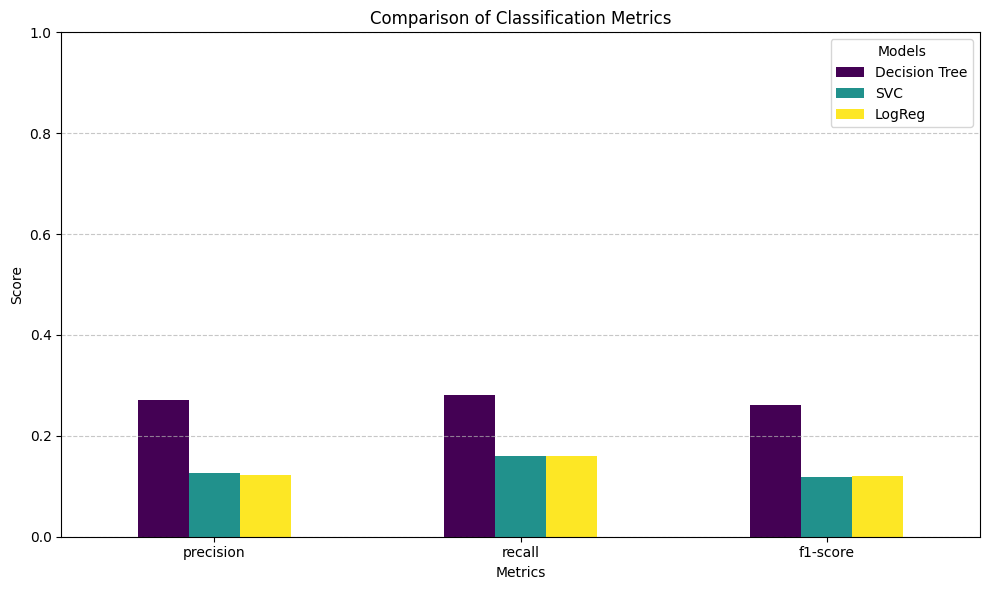

In [173]:
import matplotlib.pyplot as plt

report_dt = classification_report(y_test, y_pred_dt, output_dict=True, zero_division=0)
report_svc = classification_report(y_test, y_pred_SVC, output_dict=True, zero_division=0)
report_logreg = classification_report(y_test, y_pred_logreg, output_dict=True, zero_division=0)

# Выбираем метрики для визуализации
metrics = ['precision', 'recall', 'f1-score']
labels = ['Decision Tree', 'SVC', 'LogReg']

# Извлечение метрик
data = {
    'Decision Tree': [report_dt['macro avg'][metric] for metric in metrics],
    'SVC': [report_svc['macro avg'][metric] for metric in metrics],
    'LogReg': [report_logreg['macro avg'][metric] for metric in metrics]
}

# Создание DataFrame для удобства работы
df_plot = pd.DataFrame(data, index=metrics)

# Построение гистограммы
df_plot.plot(kind='bar', figsize=(10, 6), colormap='viridis')
plt.title('Comparison of Classification Metrics')
plt.xlabel('Metrics')
plt.ylabel('Score')
plt.ylim(0, 1)
plt.xticks(rotation=0)
plt.legend(title='Models')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

На числовых признаках все три модели показали плохое качество. Лучшей среди худших оказалась модель $\text{Decision Tree}$. Очевидно, что предсказать авторство, опираясь только на формальные характеристики текста, не учитывая при этом сам текст, очень сложно.

#### Только текстовые признаки

Используем ранее полученные матрицы векторизованного лемматизированного текста.

In [105]:
model_SVC = SVC(kernel='linear', random_state=42)
model_logreg = LogisticRegression(random_state=42, max_iter=1000)
model_dt = DecisionTreeClassifier(max_depth=5, random_state=42)

model_SVC.fit(X_train_vect, y_train)
model_logreg.fit(X_train_vect, y_train)
model_dt.fit(X_train_vect, y_train)

DecisionTreeClassifier(max_depth=5, random_state=42)

In [106]:
# Предсказания
y_pred_SVC = model_SVC.predict(X_test_vect)
y_pred_logreg = model_logreg.predict(X_test_vect)
y_pred_dt = model_dt.predict(X_test_vect)

##### Метрики качества:

###### SVC

In [107]:
# Оценка качества модели
# Accuracy
accuracy = accuracy_score(y_test, y_pred_SVC)
print("Accuracy:", accuracy)

# Precision, Recall, F1 (взвешенные для многоклассовой задачи)
precision = precision_score(y_test, y_pred_SVC, average='weighted')
recall = recall_score(y_test, y_pred_SVC, average='weighted')
f1 = f1_score(y_test, y_pred_SVC, average='weighted')

print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

# Матрица ошибок
conf_matrix = confusion_matrix(y_test, y_pred_SVC)
print("Confusion Matrix:\n", conf_matrix)

Accuracy: 0.7680311890838206
Precision: 0.7729799824499894
Recall: 0.7680311890838206
F1 Score: 0.7626639206066999
Confusion Matrix:
 [[18  0  0  0  1  1  1  0  0  0  0  0  1]
 [ 1 39  0  2  1  1  2  0  0  0  0  2  1]
 [ 6  2 27  2  0  1  0  0  0  1  0  0  1]
 [ 2  2  3 27  0  1  2  0  2  0  4  1  0]
 [ 0  0  0  0 10  1  1  0  0  0  0  0  0]
 [ 1  0  1  1  1 51  0  0  0  0  0  1  0]
 [ 0  3  0  2  1  0 58  0  0  0  0  1  1]
 [ 1  0  1  0  0  0  3  1  0  2  0  1  0]
 [ 0  0  0  1  0  0  4  0 48  0  0  0  0]
 [ 0  2  1  0  1  0  0  0  0 26  0  4  0]
 [ 0  3  0  1  0  0  0  0  1  0 32  0  0]
 [ 2  1  5  0  1  1  7  0  1  3  0 44  0]
 [ 1  1  0  1  1  1  5  1  0  2  0  0 13]]


In [108]:
# Полный отчет
print("\nClassification Report:")
print(classification_report(y_test, y_pred_SVC))


Classification Report:
                                   precision    recall  f1-score   support

     Блок Александр Александрович       0.56      0.82      0.67        22
            Бунин Иван Алексеевич       0.74      0.80      0.76        49
        Гоголь Николай Васильевич       0.71      0.68      0.69        40
     Достоевский Федор Михайлович       0.73      0.61      0.67        44
      Есенин Сергей Александрович       0.59      0.83      0.69        12
      Карамзин Николай Михайлович       0.88      0.91      0.89        56
        Куприн Александр Иванович       0.70      0.88      0.78        66
         Лермонтов Михаил Юрьевич       0.50      0.11      0.18         9
 Мамин-Сибиряк Дмитрий Наркисович       0.92      0.91      0.91        53
       Пушкин Александр Сергеевич       0.76      0.76      0.76        34
Салтыков-Щедрин Михаил Евграфович       0.89      0.86      0.88        37
          Тургенев Иван Сергеевич       0.81      0.68      0.74        65


###### LogisticRegression

In [109]:
# Оценка качества модели
# Accuracy
accuracy = accuracy_score(y_test, y_pred_logreg)
print("Accuracy:", accuracy)

# Precision, Recall, F1 (взвешенные для многоклассовой задачи)
precision = precision_score(y_test, y_pred_logreg, average='weighted')
recall = recall_score(y_test, y_pred_logreg, average='weighted')
f1 = f1_score(y_test, y_pred_logreg, average='weighted')

print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

# Матрица ошибок
conf_matrix = confusion_matrix(y_test, y_pred_logreg)
print("Confusion Matrix:\n", conf_matrix)

Accuracy: 0.8401559454191033
Precision: 0.8500100695605304
Recall: 0.8401559454191033
F1 Score: 0.8364489450070283
Confusion Matrix:
 [[16  0  0  0  2  0  2  0  0  1  0  0  1]
 [ 0 41  0  2  1  1  3  0  0  0  0  0  1]
 [ 0  2 28  2  0  3  0  0  0  4  0  1  0]
 [ 0  0  2 33  0  1  4  0  0  0  2  2  0]
 [ 0  0  0  0 11  0  1  0  0  0  0  0  0]
 [ 0  0  1  0  1 52  0  0  0  0  0  2  0]
 [ 0  1  0  0  0  0 64  0  0  0  0  0  1]
 [ 0  0  1  0  0  0  3  2  0  2  0  1  0]
 [ 0  0  0  1  0  0  3  0 47  0  0  1  1]
 [ 0  2  0  0  0  0  0  0  0 29  0  3  0]
 [ 0  2  0  0  0  0  0  0  1  1 33  0  0]
 [ 0  0  1  1  1  1  3  0  0  1  0 57  0]
 [ 1  1  0  1  1  0  1  0  0  1  1  1 18]]


In [110]:
# Полный отчет
print("\nClassification Report:")
print(classification_report(y_test, y_pred_logreg))


Classification Report:
                                   precision    recall  f1-score   support

     Блок Александр Александрович       0.94      0.73      0.82        22
            Бунин Иван Алексеевич       0.84      0.84      0.84        49
        Гоголь Николай Васильевич       0.85      0.70      0.77        40
     Достоевский Федор Михайлович       0.82      0.75      0.79        44
      Есенин Сергей Александрович       0.65      0.92      0.76        12
      Карамзин Николай Михайлович       0.90      0.93      0.91        56
        Куприн Александр Иванович       0.76      0.97      0.85        66
         Лермонтов Михаил Юрьевич       1.00      0.22      0.36         9
 Мамин-Сибиряк Дмитрий Наркисович       0.98      0.89      0.93        53
       Пушкин Александр Сергеевич       0.74      0.85      0.79        34
Салтыков-Щедрин Михаил Евграфович       0.92      0.89      0.90        37
          Тургенев Иван Сергеевич       0.84      0.88      0.86        65


###### DecisionTreeClassifier

In [111]:
# Оценка качества модели
# Accuracy
accuracy = accuracy_score(y_test, y_pred_dt)
print("Accuracy:", accuracy)

# Precision, Recall, F1 (взвешенные для многоклассовой задачи)
precision = precision_score(y_test, y_pred_dt, average='weighted', zero_division=0)
recall = recall_score(y_test, y_pred_dt, average='weighted')
f1 = f1_score(y_test, y_pred_dt, average='weighted')

print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

# Матрица ошибок
conf_matrix = confusion_matrix(y_test, y_pred_dt)
print("Confusion Matrix:\n", conf_matrix)

Accuracy: 0.5048732943469786
Precision: 0.5641506399452644
Recall: 0.5048732943469786
F1 Score: 0.4558316835577922
Confusion Matrix:
 [[ 0 15  0  0  0  2  5  0  0  0  0  0  0]
 [ 0 37  0  0  0  3  7  0  1  0  0  1  0]
 [ 0  3  4  0  0  5 26  0  0  0  1  0  1]
 [ 0  6  0  3  0  2 29  0  0  0  1  2  1]
 [ 0  0  0  0  0  3  9  0  0  0  0  0  0]
 [ 0  3  0  0  0 39 12  0  0  0  0  2  0]
 [ 0  0  0  0  0  4 62  0  0  0  0  0  0]
 [ 0  3  0  0  0  1  5  0  0  0  0  0  0]
 [ 0  1  0  0  0  0 21  0 31  0  0  0  0]
 [ 0  4  0  0  0  7 17  0  0  0  1  5  0]
 [ 0  0  0  1  0  0  5  0  0  0 30  1  0]
 [ 0  5  1  0  0  2 14  0  0  0  1 39  3]
 [ 0  0  0  0  0  2  7  0  0  0  0  3 14]]


In [112]:
# Полный отчет
print("\nClassification Report:")
print(classification_report(y_test, y_pred_dt, zero_division=0))


Classification Report:
                                   precision    recall  f1-score   support

     Блок Александр Александрович       0.00      0.00      0.00        22
            Бунин Иван Алексеевич       0.48      0.76      0.59        49
        Гоголь Николай Васильевич       0.80      0.10      0.18        40
     Достоевский Федор Михайлович       0.75      0.07      0.12        44
      Есенин Сергей Александрович       0.00      0.00      0.00        12
      Карамзин Николай Михайлович       0.56      0.70      0.62        56
        Куприн Александр Иванович       0.28      0.94      0.44        66
         Лермонтов Михаил Юрьевич       0.00      0.00      0.00         9
 Мамин-Сибиряк Дмитрий Наркисович       0.97      0.58      0.73        53
       Пушкин Александр Сергеевич       0.00      0.00      0.00        34
Салтыков-Щедрин Михаил Евграфович       0.88      0.81      0.85        37
          Тургенев Иван Сергеевич       0.74      0.60      0.66        65


##### Сводка по метрикам качества

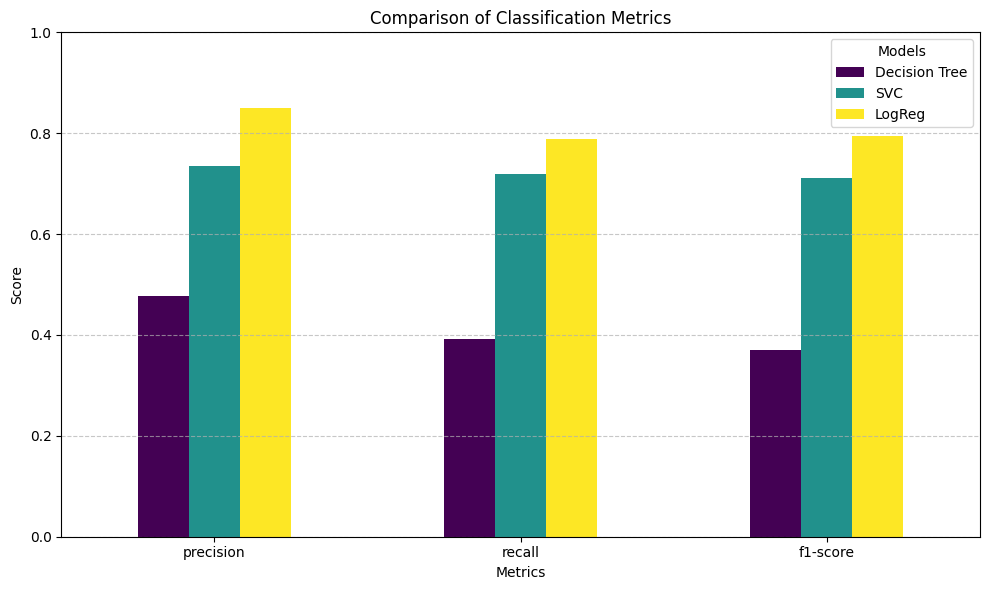

In [113]:
import matplotlib.pyplot as plt

report_dt = classification_report(y_test, y_pred_dt, output_dict=True, zero_division=0)
report_svc = classification_report(y_test, y_pred_SVC, output_dict=True, zero_division=0)
report_logreg = classification_report(y_test, y_pred_logreg, output_dict=True, zero_division=0)

# Выбираем метрики для визуализации
metrics = ['precision', 'recall', 'f1-score']
labels = ['Decision Tree', 'SVC', 'LogReg']

# Извлечение метрик
data = {
    'Decision Tree': [report_dt['macro avg'][metric] for metric in metrics],
    'SVC': [report_svc['macro avg'][metric] for metric in metrics],
    'LogReg': [report_logreg['macro avg'][metric] for metric in metrics]
}

# Создание DataFrame для удобства работы
df_plot = pd.DataFrame(data, index=metrics)

# Построение гистограммы
df_plot.plot(kind='bar', figsize=(10, 6), colormap='viridis')
plt.title('Comparison of Classification Metrics')
plt.xlabel('Metrics')
plt.ylabel('Score')
plt.ylim(0, 1)
plt.xticks(rotation=0)
plt.legend(title='Models')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

Текстовые признаки показали значительно лучший результат, чем отдельные числовые метрики. Наивысшие метрики качество при этом показала стандартная логистическая регрессия.

#### Эвристики + текстовые признаки

Стоит отметить, что эвиристики и текстовые признаки векторизации имеют разную природу. Это значит, что при необходимости стандартизации / векторизации нужно рассматривать наборы фичей отдельно.

In [176]:
X_heur_train, X_heur_test, X_text_train, X_text_test, y_train, y_test = train_test_split(X_heuristics, X_text, y, test_size=0.2, random_state=42)

In [177]:
vectorizer = CountVectorizer(ngram_range=(1, 2), max_features=5000)

# Преобразование текстов в векторное представление
X_train_vect = vectorizer.fit_transform(X_text_train)
X_test_vect = vectorizer.transform(X_text_test)

In [180]:
# Стандартизация эвристик
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_heur_train)
X_test_scaled = scaler.transform(X_heur_test)

In [181]:
# Формирование итоговых датасетов
X_train_combined = np.hstack([X_train_scaled, X_train_vect.toarray()])
X_test_combined = np.hstack([X_test_scaled, X_test_vect.toarray()])

In [182]:
X_train_combined.shape

(2051, 5003)

Теперь у нас $3$ эвристики и $5000$ текстовых фичей.

In [183]:
# Инициализация и обучение моделей
model_SVC = SVC(kernel='linear', random_state=42)
model_logreg = LogisticRegression(random_state=42, max_iter=1000)
model_dt = DecisionTreeClassifier(max_depth=5, random_state=42)

model_SVC.fit(X_train_combined, y_train)
model_logreg.fit(X_train_combined, y_train)
model_dt.fit(X_train_combined, y_train)

DecisionTreeClassifier(max_depth=5, random_state=42)

In [184]:
# Предсказания
y_pred_SVC = model_SVC.predict(X_test_combined)
y_pred_logreg = model_logreg.predict(X_test_combined)
y_pred_dt = model_dt.predict(X_test_combined)

##### Метрики качества:

###### SVC

In [185]:
# Оценка качества модели
# Accuracy
accuracy = accuracy_score(y_test, y_pred_SVC)
print("Accuracy:", accuracy)

# Precision, Recall, F1 (взвешенные для многоклассовой задачи)
precision = precision_score(y_test, y_pred_SVC, average='weighted')
recall = recall_score(y_test, y_pred_SVC, average='weighted')
f1 = f1_score(y_test, y_pred_SVC, average='weighted')

print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

# Матрица ошибок
conf_matrix = confusion_matrix(y_test, y_pred_SVC)
print("Confusion Matrix:\n", conf_matrix)

Accuracy: 0.7875243664717348
Precision: 0.7943000543636136
Recall: 0.7875243664717348
F1 Score: 0.7802876631521647
Confusion Matrix:
 [[19  0  0  0  0  0  1  0  0  0  0  0  2]
 [ 1 40  0  1  0  1  3  0  0  0  1  1  1]
 [ 5  2 29  1  0  1  0  0  0  1  0  0  1]
 [ 2  3  3 25  0  0  1  0  2  0  4  4  0]
 [ 0  0  0  1 11  0  0  0  0  0  0  0  0]
 [ 1  0  1  1  1 51  0  0  0  0  0  1  0]
 [ 0  2  0  1  0  0 62  0  0  1  0  0  0]
 [ 0  0  0  0  0  0  4  1  0  2  0  1  1]
 [ 0  0  0  1  0  0  4  0 48  0  0  0  0]
 [ 0  2  1  0  1  0  0  0  0 26  0  4  0]
 [ 0  2  0  2  0  0  0  0  1  0 31  0  1]
 [ 1  1  5  0  1  2  6  0  1  2  0 46  0]
 [ 1  1  0  1  1  1  3  0  0  2  1  0 15]]


In [186]:
# Полный отчет
print("\nClassification Report:")
print(classification_report(y_test, y_pred_SVC))


Classification Report:
                                   precision    recall  f1-score   support

     Блок Александр Александрович       0.63      0.86      0.73        22
            Бунин Иван Алексеевич       0.75      0.82      0.78        49
        Гоголь Николай Васильевич       0.74      0.72      0.73        40
     Достоевский Федор Михайлович       0.74      0.57      0.64        44
      Есенин Сергей Александрович       0.73      0.92      0.81        12
      Карамзин Николай Михайлович       0.91      0.91      0.91        56
        Куприн Александр Иванович       0.74      0.94      0.83        66
         Лермонтов Михаил Юрьевич       1.00      0.11      0.20         9
 Мамин-Сибиряк Дмитрий Наркисович       0.92      0.91      0.91        53
       Пушкин Александр Сергеевич       0.76      0.76      0.76        34
Салтыков-Щедрин Михаил Евграфович       0.84      0.84      0.84        37
          Тургенев Иван Сергеевич       0.81      0.71      0.75        65


###### LogisticRegression

In [187]:
# Оценка качества модели
# Accuracy
accuracy = accuracy_score(y_test, y_pred_logreg)
print("Accuracy:", accuracy)

# Precision, Recall, F1 (взвешенные для многоклассовой задачи)
precision = precision_score(y_test, y_pred_logreg, average='weighted')
recall = recall_score(y_test, y_pred_logreg, average='weighted')
f1 = f1_score(y_test, y_pred_logreg, average='weighted')

print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

# Матрица ошибок
conf_matrix = confusion_matrix(y_test, y_pred_logreg)
print("Confusion Matrix:\n", conf_matrix)

Accuracy: 0.847953216374269
Precision: 0.8568451427559931
Recall: 0.847953216374269
F1 Score: 0.8433695671807833
Confusion Matrix:
 [[15  0  0  0  1  0  3  0  0  2  0  0  1]
 [ 0 42  0  1  1  1  2  0  0  0  1  0  1]
 [ 0  2 28  2  0  3  0  0  0  4  0  1  0]
 [ 0  0  2 33  0  0  4  0  0  0  2  3  0]
 [ 0  0  0  0 11  0  1  0  0  0  0  0  0]
 [ 0  0  1  1  0 53  0  0  0  0  0  1  0]
 [ 0  0  0  0  0  0 65  0  0  0  0  0  1]
 [ 0  0  0  0  0  0  3  2  0  2  0  1  1]
 [ 0  0  0  1  0  0  4  0 47  0  0  1  0]
 [ 0  2  0  0  0  0  0  0  0 29  0  3  0]
 [ 0  2  0  0  0  0  0  0  1  0 34  0  0]
 [ 0  0  1  1  1  1  2  0  0  1  0 58  0]
 [ 1  1  0  1  1  0  1  0  0  1  1  1 18]]


In [188]:
# Полный отчет
print("\nClassification Report:")
print(classification_report(y_test, y_pred_logreg))


Classification Report:
                                   precision    recall  f1-score   support

     Блок Александр Александрович       0.94      0.68      0.79        22
            Бунин Иван Алексеевич       0.86      0.86      0.86        49
        Гоголь Николай Васильевич       0.88      0.70      0.78        40
     Достоевский Федор Михайлович       0.82      0.75      0.79        44
      Есенин Сергей Александрович       0.73      0.92      0.81        12
      Карамзин Николай Михайлович       0.91      0.95      0.93        56
        Куприн Александр Иванович       0.76      0.98      0.86        66
         Лермонтов Михаил Юрьевич       1.00      0.22      0.36         9
 Мамин-Сибиряк Дмитрий Наркисович       0.98      0.89      0.93        53
       Пушкин Александр Сергеевич       0.74      0.85      0.79        34
Салтыков-Щедрин Михаил Евграфович       0.89      0.92      0.91        37
          Тургенев Иван Сергеевич       0.84      0.89      0.87        65


###### DecisionTreeClassifier

In [189]:
# Оценка качества модели
# Accuracy
accuracy = accuracy_score(y_test, y_pred_dt)
print("Accuracy:", accuracy)

# Precision, Recall, F1 (взвешенные для многоклассовой задачи)
precision = precision_score(y_test, y_pred_dt, average='weighted', zero_division=0)
recall = recall_score(y_test, y_pred_dt, average='weighted')
f1 = f1_score(y_test, y_pred_dt, average='weighted')

print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

# Матрица ошибок
conf_matrix = confusion_matrix(y_test, y_pred_dt)
print("Confusion Matrix:\n", conf_matrix)

Accuracy: 0.5048732943469786
Precision: 0.5728882558776139
Recall: 0.5048732943469786
F1 Score: 0.4556168636912725
Confusion Matrix:
 [[ 0 15  0  0  0  2  5  0  0  0  0  0  0]
 [ 0 37  0  0  0  3  7  0  1  0  0  1  0]
 [ 0  3  3  1  0  5 26  0  0  0  1  0  1]
 [ 0  6  0  4  0  2 29  0  0  0  0  2  1]
 [ 0  0  0  0  0  3  9  0  0  0  0  0  0]
 [ 0  3  0  0  0 39 12  0  0  0  0  2  0]
 [ 0  0  0  0  0  4 62  0  0  0  0  0  0]
 [ 0  3  0  0  0  1  5  0  0  0  0  0  0]
 [ 0  1  0  0  0  0 21  0 30  0  0  1  0]
 [ 0  4  0  0  0  7 17  0  0  0  1  5  0]
 [ 0  0  0  0  0  0  5  0  0  0 31  1  0]
 [ 0  5  0  1  0  2 14  0  0  0  1 39  3]
 [ 0  0  0  0  0  2  7  0  0  0  0  3 14]]


In [190]:
# Полный отчет
print("\nClassification Report:")
print(classification_report(y_test, y_pred_dt, zero_division=0))


Classification Report:
                                   precision    recall  f1-score   support

     Блок Александр Александрович       0.00      0.00      0.00        22
            Бунин Иван Алексеевич       0.48      0.76      0.59        49
        Гоголь Николай Васильевич       1.00      0.07      0.14        40
     Достоевский Федор Михайлович       0.67      0.09      0.16        44
      Есенин Сергей Александрович       0.00      0.00      0.00        12
      Карамзин Николай Михайлович       0.56      0.70      0.62        56
        Куприн Александр Иванович       0.28      0.94      0.44        66
         Лермонтов Михаил Юрьевич       0.00      0.00      0.00         9
 Мамин-Сибиряк Дмитрий Наркисович       0.97      0.57      0.71        53
       Пушкин Александр Сергеевич       0.00      0.00      0.00        34
Салтыков-Щедрин Михаил Евграфович       0.91      0.84      0.87        37
          Тургенев Иван Сергеевич       0.72      0.60      0.66        65


##### Сводка по метрикам качества

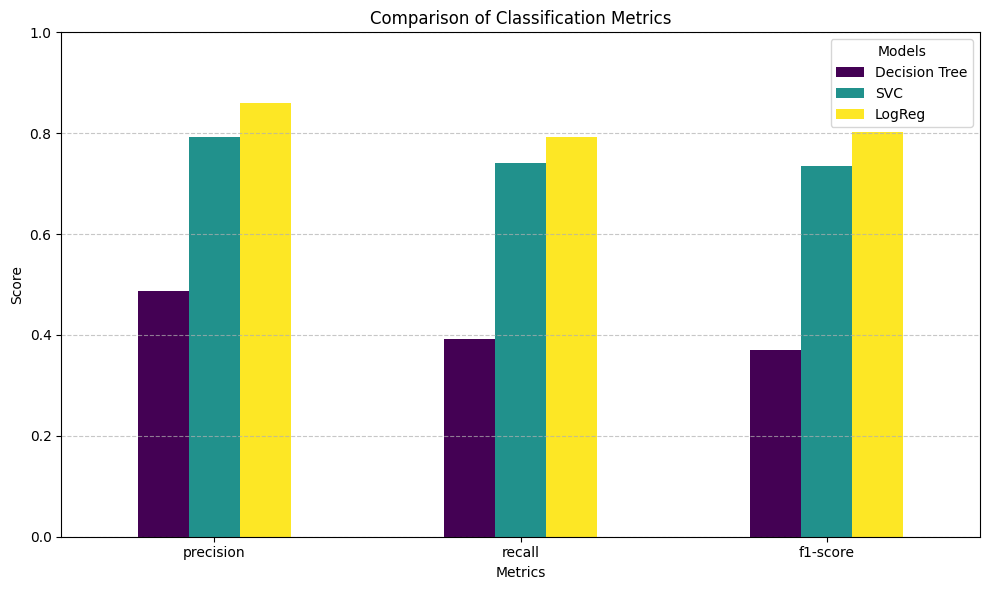

In [191]:
report_dt = classification_report(y_test, y_pred_dt, output_dict=True, zero_division=0)
report_svc = classification_report(y_test, y_pred_SVC, output_dict=True, zero_division=0)
report_logreg = classification_report(y_test, y_pred_logreg, output_dict=True, zero_division=0)

# Выбираем метрики для визуализации
metrics = ['precision', 'recall', 'f1-score']
labels = ['Decision Tree', 'SVC', 'LogReg']

# Извлечение метрик
data = {
    'Decision Tree': [report_dt['macro avg'][metric] for metric in metrics],
    'SVC': [report_svc['macro avg'][metric] for metric in metrics],
    'LogReg': [report_logreg['macro avg'][metric] for metric in metrics]
}

# Создание DataFrame для удобства работы
df_plot = pd.DataFrame(data, index=metrics)

# Построение гистограммы
df_plot.plot(kind='bar', figsize=(10, 6), colormap='viridis')
plt.title('Comparison of Classification Metrics')
plt.xlabel('Metrics')
plt.ylabel('Score')
plt.ylim(0, 1)
plt.xticks(rotation=0)
plt.legend(title='Models')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

Комбинированный подход практически идентичен по результатам подходу с текстовыми признаками, однако метрики качества незначительно выросли на тысячные доли.<br>

Можем сделать вывод, что комбинированный подход (эвристики + текстовые признаки) для модели логистической регрессии $\text{LogReg}$ дает лучшие результаты.